# Semantic Segmentation Models Benchmark

This notebook compares different configurations of the **SegFormer** model trained on the ForestSim dataset (24 semantic classes), with the goal of selecting the best configuration to use as the student/baseline network in the navigation pipeline.

For each model, the following are reported:
- **Training curves**: loss and metric trends on the train/validation sets;
- **Quantitative evaluation**: segmentation metrics (e.g. mIoU, per-class accuracy) and confusion matrix on the test set;
- **Qualitative evaluation**: visual examples of predictions on test images;
- **Performance benchmark**: model inference time and throughput.

The compared configurations vary in the **loss function** used during training (Dice + Cross-Entropy, Focal, Tversky).

In [1]:
import pandas as pd
import torch

from dataset.dataloader import ForestDataLoader
from dataset.transforms import ForestTransforms

from models.segformer import SegFormer

from training.metrics import Metrics

from evaluation.training_plots import TrainingPlots
from evaluation.qualitative_evaluation import QualitativeEvaluation
from evaluation.quantitative_evaluation import QuantitativeEvaluation
from evaluation.benchmark import Benchmark
from evaluation.plots import Plots
from training.logger import Logger

/home/inginf2026mardig/.virtualenvs/Forest_Semantic_Navigation/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

device

device(type='cuda')

In [3]:
test_transform = ForestTransforms(augmentation=False, train=False).get_transforms()
dataloader = ForestDataLoader(test_transform=test_transform)
dataloader.create_dataloaders()

print("Train:", len(dataloader.train_dataset))
print("Validation:", len(dataloader.validation_dataset))
print("Test:", len(dataloader.test_dataset))

Train: 1695
Validation: 189
Test: 209


In [4]:
metrics = Metrics(num_classes=24)

## SegFormer B1 — Dice + Cross-Entropy

**SegFormer B1** model (higher capacity than B0) trained with combined **Dice + Cross-Entropy** loss, to evaluate the impact of greater model capacity given the same loss function.

In [ ]:
model = SegFormer().get_model()

In [5]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,1.328469,0.905448,0.00006,0.780620,0.156955,0.211462,0.148182,0.638174
1,2,0.869815,0.756569,0.00006,0.812194,0.180495,0.253760,0.178606,0.684352
2,3,0.755725,0.690779,0.00006,0.836614,0.221028,0.301031,0.214292,0.733459
3,4,0.698331,0.654987,0.00006,0.849638,0.228147,0.310453,0.221853,0.748058
4,5,0.663637,0.626686,0.00006,0.856864,0.236511,0.322987,0.230072,0.761339


In [6]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.328432,0.404079,0.000001,0.902558,0.363948,0.511317,0.367467,0.828761
146,147,0.330192,0.405159,0.000001,0.902418,0.364840,0.511821,0.368225,0.828669
147,148,0.330698,0.404650,0.000001,0.902512,0.362593,0.509173,0.366868,0.828493
148,149,0.328631,0.403471,0.000001,0.902582,0.364783,0.512589,0.367674,0.829047
149,150,0.329922,0.403971,0.000001,0.902581,0.364162,0.511638,0.368057,0.828919


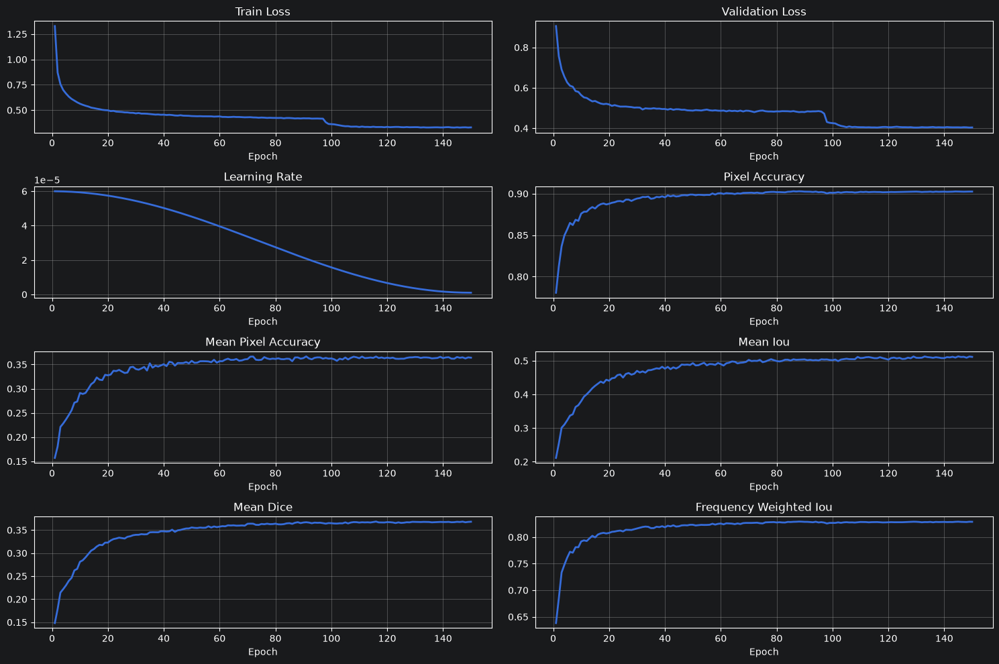

In [7]:
training_plots = TrainingPlots()

training_plots.plot_all()

In [10]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8957
Mean Pixel Accuracy   : 0.3323
Mean IoU              : 0.4951
Mean Dice             : 0.3367
Frequency Weighted IoU: 0.8199

IoU per class:
Class 0: 0.7358
Class 1: 0.8036
Class 2: 0.4765
Class 3: 0.9081
Class 4: 0.8248
Class 5: 0.0000
Class 6: 0.4043
Class 7: 0.8526
Class 8: 0.7554
Class 9: 0.6953
Class 10: 0.6760
Class 11: 0.7235
Class 12: N/A
Class 13: N/A
Class 14: 0.6326
Class 15: 0.5596
Class 16: N/A
Class 17: 0.7023
Class 18: 0.1382
Class 19: 0.3705
Class 20: 0.1879
Class 21: 0.7935
Class 22: 0.7172
Class 23: 0.8769


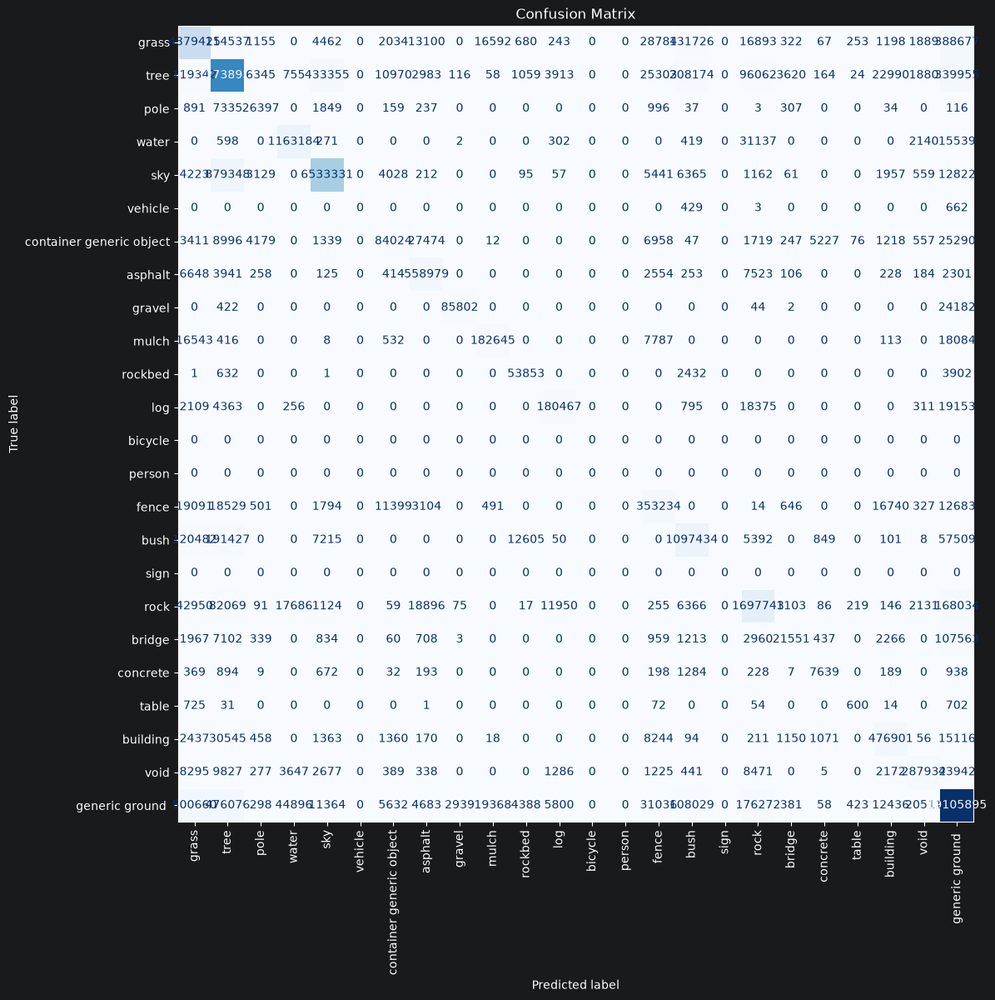

In [11]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

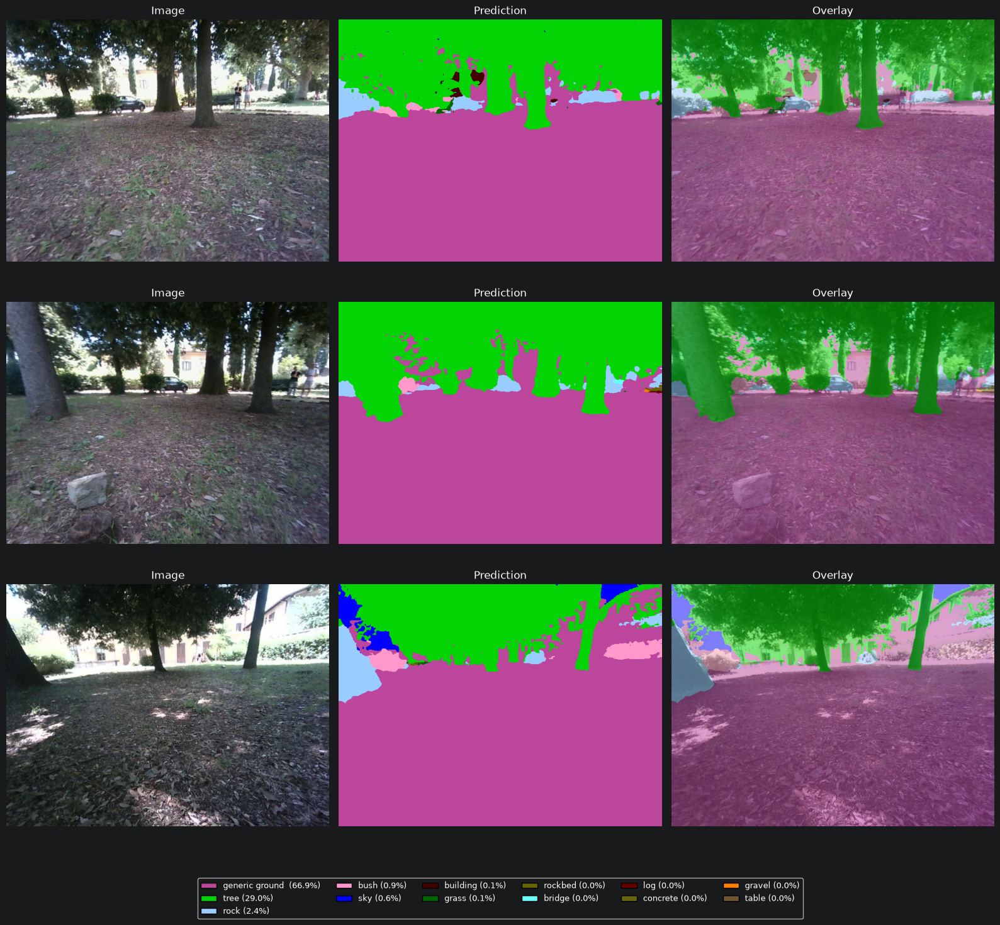

In [12]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [13]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 13,683,416
Trainable            : 13,683,416
Batch size           : 8
Latency              : 12.01 ms
FPS                  : 83.23
Throughput           : 665.85 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB


## SegFormer B1 — Tversky

**SegFormer B1** model trained with **Tversky** loss, to evaluate the impact of model capacity given the loss function.

In [ ]:
model = SegFormer().get_model()

In [6]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,0.937454,0.883701,0.00006,0.719061,0.192676,0.195942,0.176434,0.572103
1,2,0.866874,0.848853,0.00006,0.745883,0.215925,0.215542,0.189969,0.608935
2,3,0.831085,0.811388,0.00006,0.792315,0.218904,0.242081,0.206942,0.655949
3,4,0.798419,0.786127,0.00006,0.813076,0.239807,0.266069,0.230667,0.691981
4,5,0.770762,0.757638,0.00006,0.827664,0.267584,0.297908,0.256301,0.715586


In [7]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.533004,0.592910,0.000001,0.876866,0.419173,0.472258,0.404981,0.789352
146,147,0.535748,0.592920,0.000001,0.876955,0.419174,0.472349,0.404952,0.789544
147,148,0.532916,0.593282,0.000001,0.877015,0.418377,0.472672,0.405039,0.789600
148,149,0.543016,0.593594,0.000001,0.877383,0.417627,0.472895,0.405153,0.790113
149,150,0.539707,0.593473,0.000001,0.877266,0.417775,0.472881,0.405145,0.789957


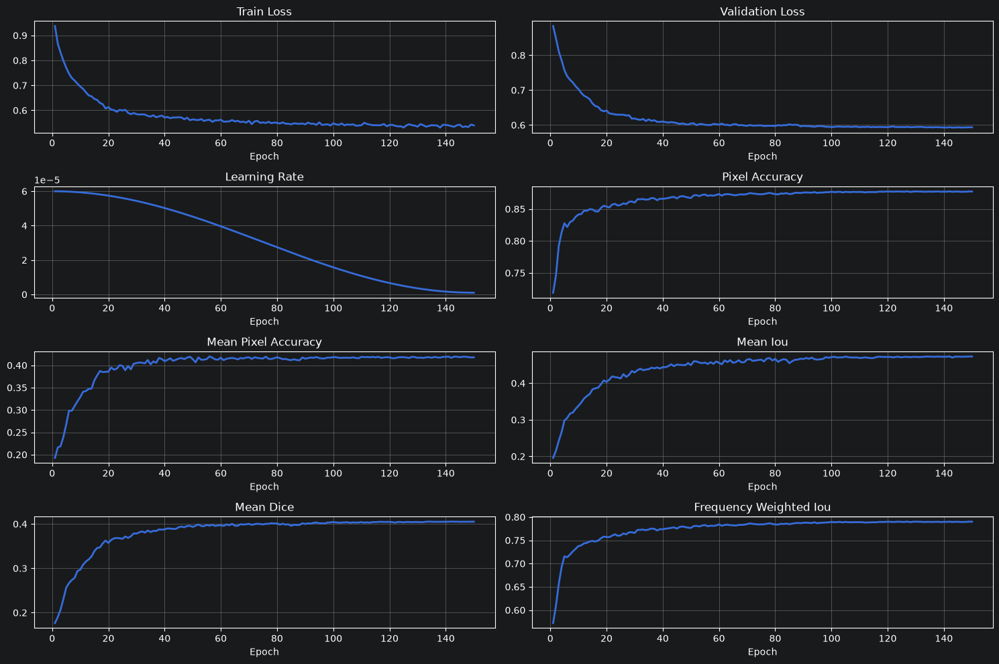

In [8]:
training_plots = TrainingPlots()

training_plots.plot_all()

In [7]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8692
Mean Pixel Accuracy   : 0.3174
Mean IoU              : 0.4485
Mean Dice             : 0.3101
Frequency Weighted IoU: 0.7806

IoU per class:
Class 0: 0.6977
Class 1: 0.7731
Class 2: 0.4927
Class 3: 0.8874
Class 4: 0.8126
Class 5: 0.0000
Class 6: 0.3994
Class 7: 0.8608
Class 8: 0.0000
Class 9: 0.0000
Class 10: 0.6726
Class 11: 0.6799
Class 12: N/A
Class 13: N/A
Class 14: 0.4892
Class 15: 0.5229
Class 16: N/A
Class 17: 0.6618
Class 18: 0.1073
Class 19: 0.2011
Class 20: 0.0000
Class 21: 0.7867
Class 22: 0.0470
Class 23: 0.8383


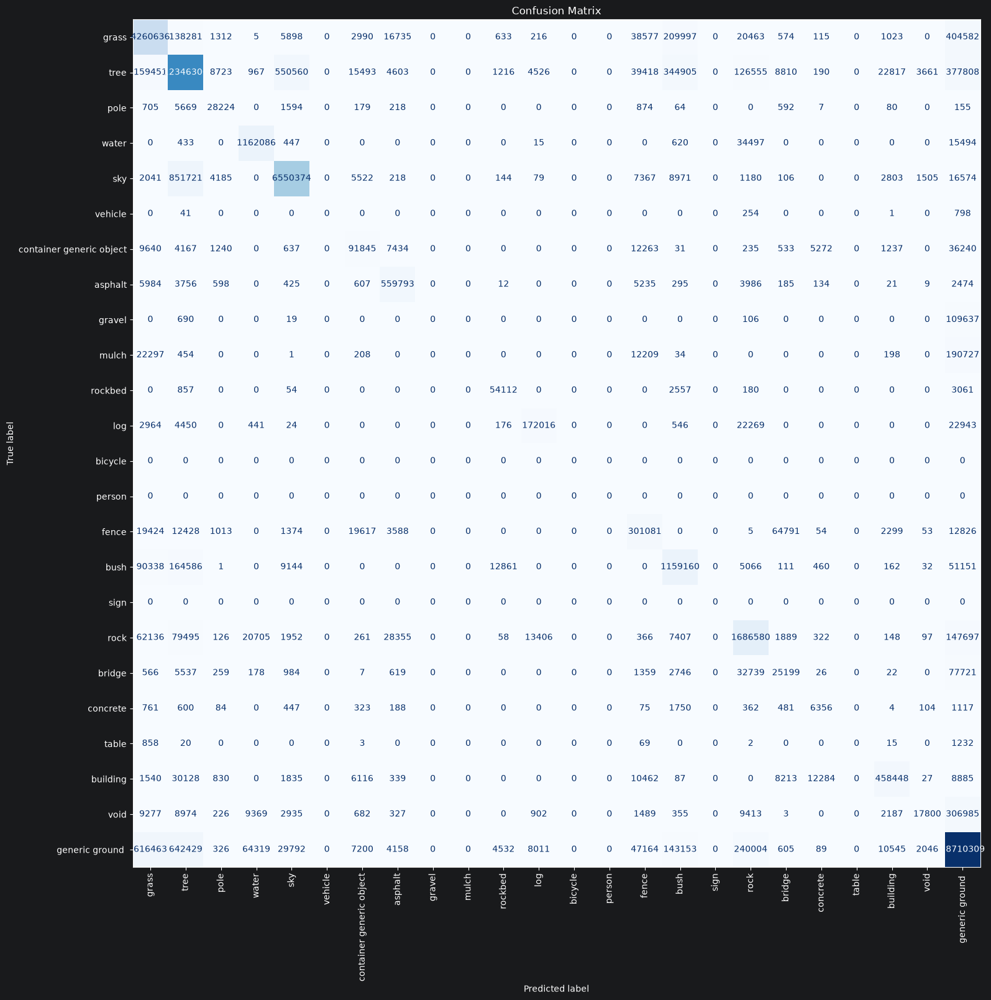

In [8]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

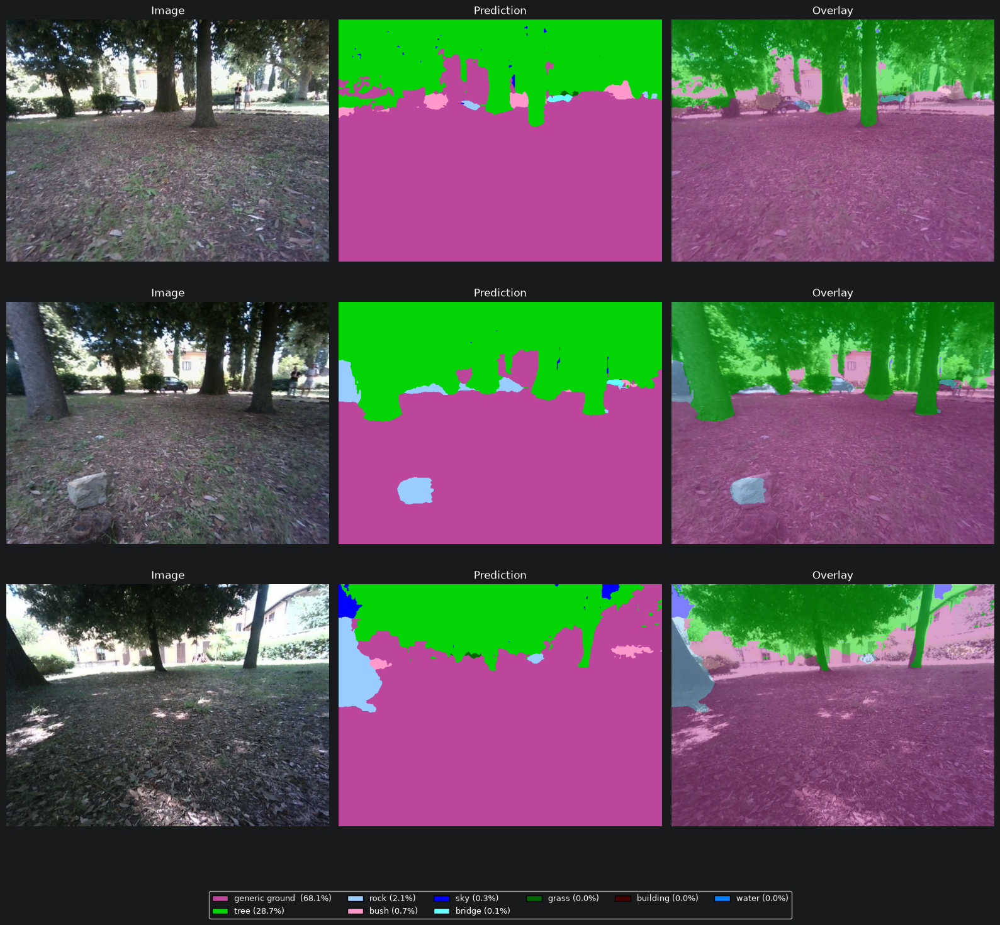

In [9]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [12]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 13,683,416
Trainable            : 13,683,416
Batch size           : 8
Latency              : 12.01 ms
FPS                  : 83.27
Throughput           : 666.17 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB


## SegFormer B1 — Dice

**SegFormer B1** model trained with **Dice** loss, to evaluate the impact of model capacity.

In [ ]:
model = SegFormer().get_model()

In [7]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,0.915656,0.860110,0.00006,0.763468,0.175572,0.225886,0.166244,0.626580
1,2,0.841468,0.820072,0.00006,0.788455,0.196464,0.258461,0.186011,0.662684
2,3,0.806626,0.791881,0.00006,0.809166,0.234879,0.293049,0.220147,0.703738
3,4,0.781895,0.778535,0.00006,0.827942,0.243886,0.304341,0.227377,0.725691
4,5,0.767267,0.767200,0.00006,0.836632,0.251926,0.326826,0.239575,0.732152


In [8]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.420401,0.455237,0.000001,0.885413,0.351023,0.478913,0.351827,0.802622
146,147,0.413720,0.455977,0.000001,0.885285,0.349381,0.475626,0.351393,0.802345
147,148,0.415897,0.455608,0.000001,0.885440,0.349606,0.474427,0.351617,0.802617
148,149,0.416912,0.454715,0.000001,0.885208,0.352801,0.475753,0.352205,0.802552
149,150,0.420438,0.454567,0.000001,0.885291,0.352756,0.475312,0.352400,0.802553


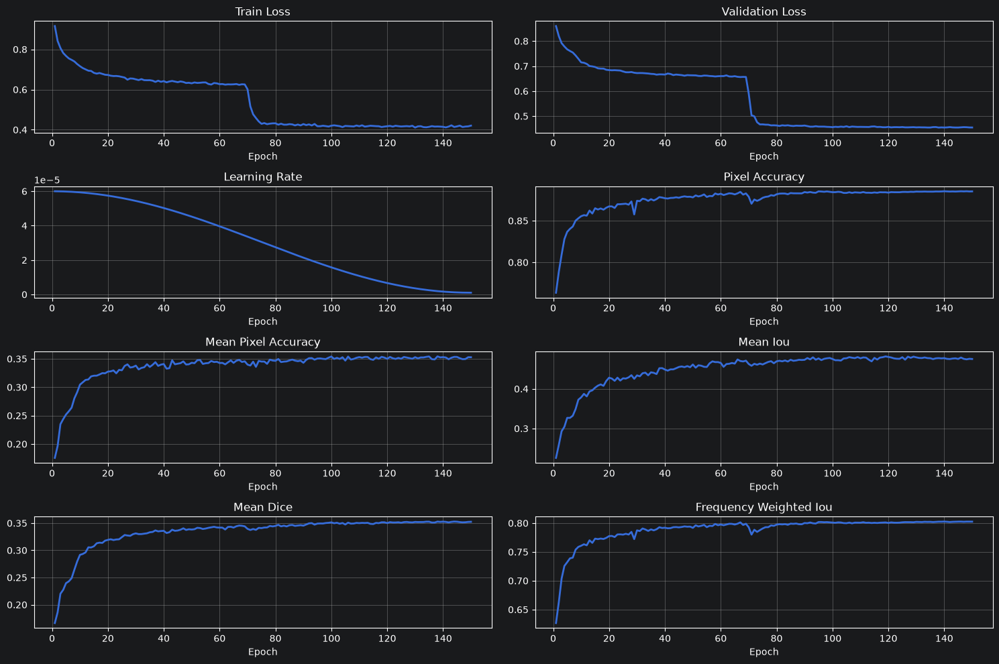

In [9]:
training_plots = TrainingPlots()

training_plots.plot_all()

In [10]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8786
Mean Pixel Accuracy   : 0.3200
Mean IoU              : 0.4641
Mean Dice             : 0.3216
Frequency Weighted IoU: 0.7934

IoU per class:
Class 0: 0.7046
Class 1: 0.7835
Class 2: 0.5034
Class 3: 0.9008
Class 4: 0.8143
Class 5: 0.0000
Class 6: 0.4379
Class 7: 0.8480
Class 8: 0.0000
Class 9: 0.6715
Class 10: 0.7013
Class 11: 0.6930
Class 12: N/A
Class 13: N/A
Class 14: 0.6392
Class 15: 0.5422
Class 16: N/A
Class 17: 0.6744
Class 18: 0.1269
Class 19: 0.2954
Class 20: 0.0319
Class 21: 0.8292
Class 22: 0.0448
Class 23: 0.8471


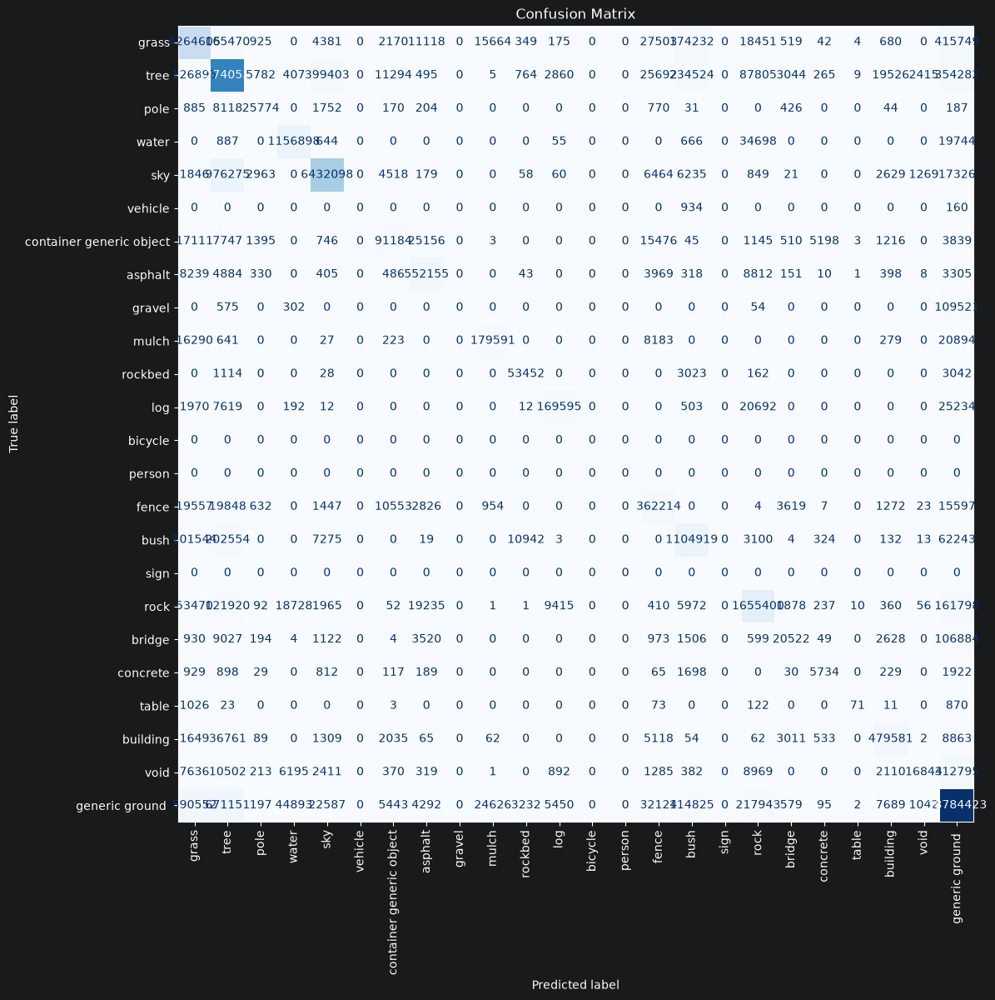

In [11]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

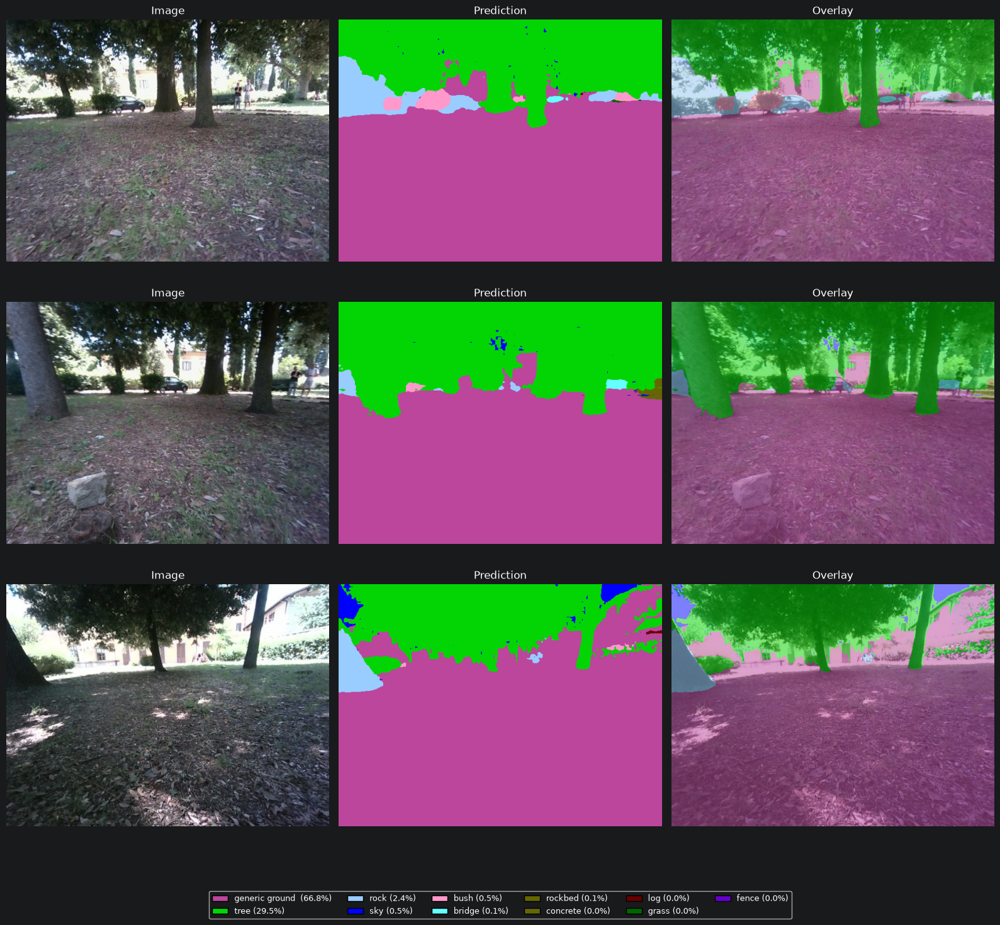

In [12]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [13]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 13,683,416
Trainable            : 13,683,416
Batch size           : 8
Latency              : 12.01 ms
FPS                  : 83.26
Throughput           : 666.05 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB


## SegFormer B1 — Focal

**SegFormer B1** model trained with **Focal** loss, to evaluate the impact of model capacity.

In [ ]:
model = SegFormer().get_model()

In [ ]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

In [ ]:
logs.tail()

In [ ]:
plots = TrainingPlots()

plots.plot_all()

In [ ]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()

In [ ]:
plots.confusion_matrix(results["confusion_matrix"])

In [ ]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [ ]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)

## Compare all

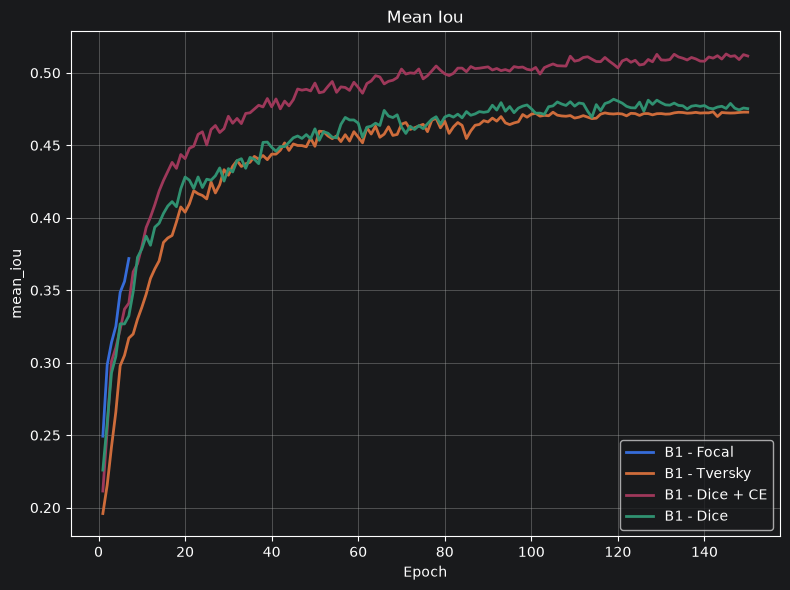

In [9]:
training_plots = TrainingPlots()

training_plots.compare_metric("mean_iou")